In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/drive/MyDrive/dataset(kaggle)')

In [ ]:
import pandas as pd
df = pd.read_csv('BankChurners.csv')

In [ ]:
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.999910
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.999940
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.999980
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.999870
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.999980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0.000191,0.999810
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,0.995270,0.004729
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,0.997880,0.002118
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,0.996710,0.003294


# 1. data overview

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [ ]:
df.drop(columns=['Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1','Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2']
        ,axis=1
        ,inplace=True)
df

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,Existing Customer,50,M,2,Graduate,Single,$40K - $60K,Blue,40,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,710638233,Attrited Customer,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,716506083,Attrited Customer,44,F,1,High School,Married,Less than $40K,Blue,36,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,717406983,Attrited Customer,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

from pandas_profiling import ProfileReport
import seaborn as sns
from sklearn import metrics

from copy import deepcopy

In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
credit_card_report = ProfileReport(df)

In [ ]:
credit_card_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
df.isna().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# categorical data -> numeric data

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [ ]:
df['class'] = le.fit_transform(df['Attrition_Flag'])

In [ ]:
# Reverse the encoding of the class column
max_encoded = df['class'].max()
df['class'] = max_encoded - df['class']

# Print the updated DataFrame
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0


In [ ]:
df['class'].value_counts()

0    8500
1    1627
Name: class, dtype: int64

In [ ]:
df.drop('Attrition_Flag', axis=1,inplace=True)
df

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class
0,768805383,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0
1,818770008,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,769911858,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,...,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0
10123,710638233,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,...,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,1
10124,716506083,44,F,1,High School,Married,Less than $40K,Blue,36,5,...,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,1
10125,717406983,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,...,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,1


In [ ]:
# Making a copy of the data to save the original data
original_df = deepcopy(df)

In [ ]:
df = deepcopy(original_df)

In [ ]:
df

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class
0,768805383,45,M,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0
1,818770008,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,769911858,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,M,2,Graduate,Single,$40K - $60K,Blue,40,3,...,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0
10123,710638233,41,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,...,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,1
10124,716506083,44,F,1,High School,Married,Less than $40K,Blue,36,5,...,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,1
10125,717406983,30,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,...,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,1


# 2. data feature engineering

In [ ]:
# Encode binary variables
df['Gender'] = df['Gender'].map({'M':1, 'F':0})

In [ ]:
df

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,...,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,class
0,768805383,45,1,3,High School,Married,$60K - $80K,Blue,39,5,...,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0
1,818770008,49,0,5,Graduate,Single,Less than $40K,Blue,44,6,...,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0
2,713982108,51,1,3,Graduate,Married,$80K - $120K,Blue,36,4,...,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0
3,769911858,40,0,4,High School,Unknown,Less than $40K,Blue,34,3,...,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0
4,709106358,40,1,3,Uneducated,Married,$60K - $80K,Blue,21,5,...,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,772366833,50,1,2,Graduate,Single,$40K - $60K,Blue,40,3,...,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462,0
10123,710638233,41,1,2,Unknown,Divorced,$40K - $60K,Blue,25,4,...,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511,1
10124,716506083,44,0,1,High School,Married,Less than $40K,Blue,36,5,...,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000,1
10125,717406983,30,1,2,Graduate,Unknown,$40K - $60K,Blue,36,4,...,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000,1


## one hot encoding

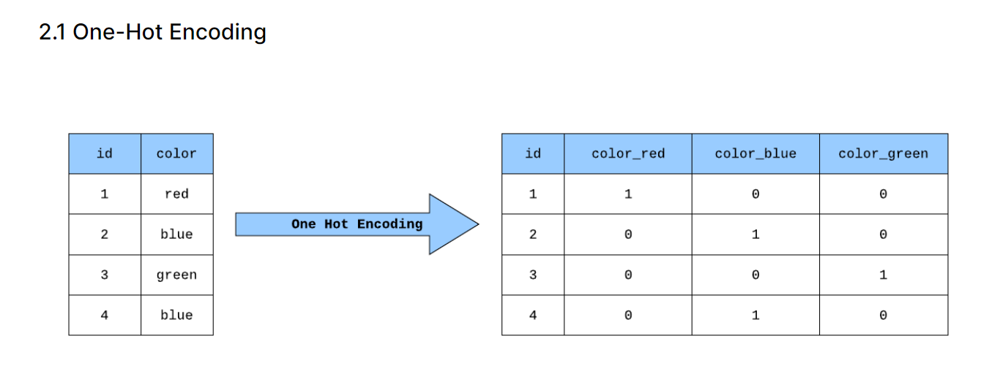

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Customer_Age              10127 non-null  int64  
 2   Gender                    10127 non-null  int64  
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

In [ ]:
# Finding all the categorical columns from the data
categorical_columns = df.select_dtypes(exclude=['int64','float64']).columns
numerical_columns = df.drop('class', axis=1).select_dtypes(include=['int64','float64']).columns
categorical_columns

Index(['Education_Level', 'Marital_Status', 'Income_Category',
       'Card_Category'],
      dtype='object')

In [ ]:
# One hot encoding independent variable x
def encode_and_bind(original_dataframe, feature_to_encode):
    dummies = pd.get_dummies(original_dataframe[[feature_to_encode]])
    res = pd.concat([original_dataframe, dummies], axis=1)
    res = res.drop([feature_to_encode], axis=1)
    return(res) 

In [ ]:
for feature in categorical_columns:
    df = encode_and_bind(df, feature)

df.head()

,CLIENTNUM,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,768805383,45,1,3,39,5,1,3,12691.0,777,...,0,0,1,0,0,0,1,0,0,0
1,818770008,49,0,5,44,6,1,2,8256.0,864,...,0,0,0,0,1,0,1,0,0,0
2,713982108,51,1,3,36,4,1,0,3418.0,0,...,0,0,0,1,0,0,1,0,0,0
3,769911858,40,0,4,34,3,4,1,3313.0,2517,...,0,0,0,0,1,0,1,0,0,0
4,709106358,40,1,3,21,5,1,0,4716.0,0,...,0,0,1,0,0,0,1,0,0,0


In [ ]:
# Move the class column to the first position
new_order = ['class'] + [col for col in df.columns if col != 'class']
df = df.reindex(columns=new_order)

# Print the updated DataFrame
df.head()

,class,CLIENTNUM,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0,768805383,45,1,3,39,5,1,3,12691.0,...,0,0,1,0,0,0,1,0,0,0
1,0,818770008,49,0,5,44,6,1,2,8256.0,...,0,0,0,0,1,0,1,0,0,0
2,0,713982108,51,1,3,36,4,1,0,3418.0,...,0,0,0,1,0,0,1,0,0,0
3,0,769911858,40,0,4,34,3,4,1,3313.0,...,0,0,0,0,1,0,1,0,0,0
4,0,709106358,40,1,3,21,5,1,0,4716.0,...,0,0,1,0,0,0,1,0,0,0


In [ ]:
df.shape

(10127, 38)

## 2-2 model with raw data

In [ ]:
# Generate x and y sets
x = df.drop('class', axis=1).values
y = df['class']

In [ ]:
# Splitting the dataset into training set and test set
# from sklearn.model_selection import train_test_split

# train,test = train_test_split(df, test_size = 0.2, random_state=1234)

from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.2, random_state=1234)

In [ ]:
from xgboost import XGBClassifier

classifier = XGBClassifier(random_state=1234)
classifier.fit(x_train,y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1234, ...)

In [ ]:
# Predicting the test set
y_pred = classifier.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'accuracy score: {accuracy:.4f}')

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(f'auc score: {auc:.4f}')

from sklearn.metrics import precision_score
# Calculate precision score
precision = metrics.accuracy_score(y_test, y_pred)
# Print precision score
print(f'Precision score: {precision:.4f}')

accuracy score: 0.9694
auc score: 0.9270
Precision score: 0.9694


In [ ]:
# as data is imblanced, we should consider only the AUC

## 2-3 model with SMOTE data(oversamling) 
- SMOTE(Synthetic Minority Oversampling Technique)

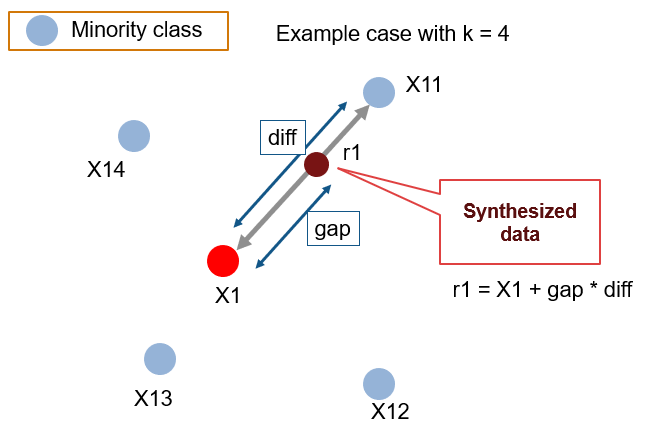

In [ ]:
# Importing packages for SMOTE
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline

from collections import Counter

In [ ]:
sm = SMOTE(sampling_strategy='auto', random_state=1234)
x_sm, y_sm = sm.fit_resample(x_train, y_train)

In [ ]:
print(Counter(y_train))
print(Counter(y_sm))

Counter({0: 6793, 1: 1308})
Counter({1: 6793, 0: 6793})


In [ ]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=list(Counter(y_train).keys()), values=list(Counter(y_train).values()), name='Original data'),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=list(Counter(y_sm).keys()), values=list(Counter(y_sm).values()), name='SMOTE data'),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="value+percent+name")
fig.update_layout(
    title_text="Class distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Original', x=0.16, y=0.5, font_size=12, showarrow=False),
                 dict(text='SMOTE', x=0.82, y=0.5, font_size=12, showarrow=False)])
fig.show()

In [ ]:
over = BorderlineSMOTE(sampling_strategy=0.3)
under = RandomUnderSampler(sampling_strategy=0.6)

steps = [('o', over), ('u', under)]

In [ ]:
pipeline = Pipeline(steps=steps)

# transform the dataset
x_sm_us, y_sm_us = pipeline.fit_resample(x_train, y_train)

print(Counter(y_train))
print(Counter(y_sm_us))

Counter({0: 6793, 1: 1308})
Counter({0: 3395, 1: 2037})


In [ ]:
list(Counter(y_train).keys())

[1, 0]

In [ ]:
fig = make_subplots(rows=1, cols=2, specs=[[{"type": "pie"}, {"type": "pie"}]])

fig.add_trace(
    go.Pie(labels=list(Counter(y_train).keys()), values=list(Counter(y_train).values()), name='Original Data'),
    row=1, col=1
)

fig.add_trace(
    go.Pie(labels=list(Counter(y_sm_us).keys()), values=list(Counter(y_sm_us).values()), name='SMOTE and US data'),
    row=1, col=2
)

fig.update_traces(textposition='inside', hole=.4, hoverinfo="percent+name+value")
fig.update_layout(
    title_text="Class distribution",
    # Add annotations in the center of the donut pies.
    annotations=[dict(text='Original', x=0.16, y=0.5, font_size=12, showarrow=False),
                 dict(text='SMOTE and UnderSample', x=0.9, y=0.5, font_size=12, showarrow=False)])
fig.show()

In [ ]:
classifier = XGBClassifier(random_state=1234)
classifier.fit(x_sm, y_sm)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1234, ...)

In [ ]:
# Predicting the test set
y_pred = classifier.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'accuracy score: {accuracy:.4f}')

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(f'auc score: {auc:.4f}')

from sklearn.metrics import precision_score
# Calculate precision score
precision = metrics.accuracy_score(y_test, y_pred)
# Print precision score
print(f'Precision score: {precision:.4f}')

accuracy score: 0.9719
auc score: 0.9400
Precision score: 0.9719


## 2-4 tomek link(undersamling)

In [ ]:
from imblearn.under_sampling import TomekLinks

In [ ]:
# Apply Tomek links undersampling to training data
tl = TomekLinks(sampling_strategy='majority')
x_train_resampled, y_train_resampled = tl.fit_resample(x_train, y_train)

In [ ]:
classifier = XGBClassifier(random_state=1234)
classifier.fit(x_train_resampled,  y_train_resampled)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1234, ...)

In [ ]:
# Predicting the test set
y_pred = classifier.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'accuracy score: {accuracy:.4f}')

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(f'auc score: {auc:.4f}')

from sklearn.metrics import precision_score
# Calculate precision score
precision = metrics.accuracy_score(y_test, y_pred)
# Print precision score
print(f'Precision score: {precision:.4f}')

accuracy score: 0.9724
auc score: 0.9403
Precision score: 0.9724


## 2-5 model with SMOTE - under data(같이 쓴거)

In [ ]:
classifier = XGBClassifier(random_state=1234)
classifier.fit(x_sm_us, y_sm_us)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=1234, ...)

In [ ]:
# Predicting the test set
y_pred = classifier.predict(x_test)

# Making the confusion matrix and calculating accuracy score
accuracy = metrics.accuracy_score(y_test, y_pred)
print(f'accuracy score: {accuracy:.4f}')

fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
auc = metrics.auc(fpr, tpr)
print(f'auc score: {auc:.4f}')

from sklearn.metrics import precision_score
# Calculate precision score
precision = metrics.accuracy_score(y_test, y_pred)
# Print precision score
print(f'Precision score: {precision:.4f}')

accuracy score: 0.9679
auc score: 0.9542
Precision score: 0.9679


## 2-6 Generate new DataFrame with SMOTE and UnderSampling data

In [ ]:
# Names of the independent variables
feature_names = list(df.drop('class', axis=1).columns)

In [ ]:
# Concatenate train (with resampling) and test sets to build the new dataframe 
sm_us_x = np.concatenate((x_sm_us, x_test))
sm_us_y = np.concatenate((y_sm_us, y_test))

In [ ]:
sm_us_df = pd.DataFrame(np.column_stack([sm_us_y, sm_us_x]), columns=['class'] + feature_names)
sm_us_df.head()

,class,CLIENTNUM,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0.0,710694033.0,32.0,1.0,0.0,36.0,2.0,1.0,1.0,7473.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,0.0,711264033.0,47.0,1.0,3.0,36.0,4.0,2.0,3.0,4786.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.0,715625658.0,49.0,0.0,3.0,36.0,3.0,1.0,3.0,4476.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
3,0.0,708243483.0,53.0,1.0,3.0,43.0,4.0,2.0,5.0,14938.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,0.0,806189658.0,50.0,0.0,2.0,45.0,4.0,2.0,3.0,1780.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_clf = RandomForestClassifier(random_state=1234)
rf_clf.fit(x_sm_us, y_sm_us)

RandomForestClassifier(random_state=1234)

In [ ]:
rf_clf.feature_importances_

array([0.02513347, 0.02694907, 0.01662169, 0.01492324, 0.02024733,
       0.05313888, 0.03697686, 0.03628704, 0.02552323, 0.08491396,
       0.02582102, 0.04802113, 0.15442985, 0.18302728, 0.12010267,
       0.0501846 , 0.00311577, 0.00161204, 0.00496432, 0.00446914,
       0.00218834, 0.00395101, 0.00416235, 0.00220859, 0.01465144,
       0.00642345, 0.00217069, 0.00179794, 0.00290375, 0.00421811,
       0.00458566, 0.00707108, 0.00262328, 0.00186869, 0.0010337 ,
       0.00027381, 0.00140554])

In [ ]:
features_to_plot = 25

importances = rf_clf.feature_importances_
indices = np.argsort(importances)

best_vars = np.array(feature_names)[indices][-features_to_plot:]
values = importances[indices][-features_to_plot:]
best_vars

array(['Education_Level_Uneducated', 'Education_Level_Unknown',
       'Income_Category_$60K - $80K', 'Education_Level_High School',
       'Income_Category_$80K - $120K', 'Education_Level_Graduate',
       'Marital_Status_Single', 'Income_Category_Less than $40K',
       'Marital_Status_Married', 'Dependent_count', 'Gender',
       'Months_on_book', 'CLIENTNUM', 'Credit_Limit', 'Avg_Open_To_Buy',
       'Customer_Age', 'Contacts_Count_12_mon', 'Months_Inactive_12_mon',
       'Total_Amt_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Total_Relationship_Count', 'Total_Revolving_Bal',
       'Total_Ct_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct'],
      dtype='<U30')

<ipython-input-104-bb78066528bc>:4: UserWarning:

FixedFormatter should only be used together with FixedLocator



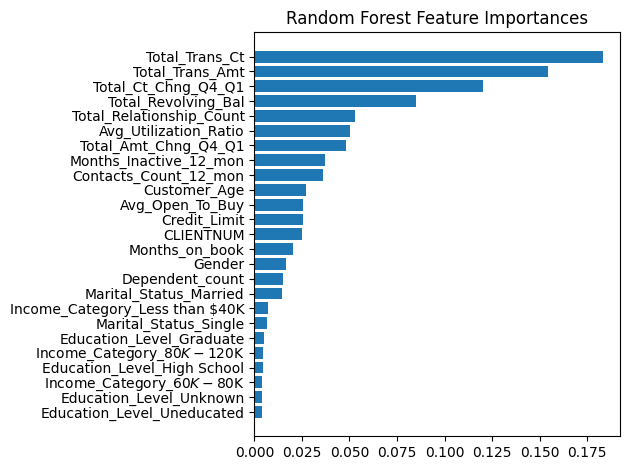

In [ ]:
y_ticks = np.arange(0, features_to_plot)
fig, ax = plt.subplots()
ax.barh(y_ticks, values)
ax.set_yticklabels(best_vars)
ax.set_yticks(y_ticks)
ax.set_title("Random Forest Feature Importances")
fig.tight_layout()
plt.show()

In [ ]:
best_vars = best_vars[-20:]
best_vars

array(['Education_Level_Graduate', 'Marital_Status_Single',
       'Income_Category_Less than $40K', 'Marital_Status_Married',
       'Dependent_count', 'Gender', 'Months_on_book', 'CLIENTNUM',
       'Credit_Limit', 'Avg_Open_To_Buy', 'Customer_Age',
       'Contacts_Count_12_mon', 'Months_Inactive_12_mon',
       'Total_Amt_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Total_Relationship_Count', 'Total_Revolving_Bal',
       'Total_Ct_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct'],
      dtype='<U30')

# modle 재학습
- h20 autoML

## H20 AUToML

In [ ]:
# 자바설치하기

In [ ]:
!apt-get install default-jre

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  default-jre-headless fonts-dejavu-core fonts-dejavu-extra
  libatk-wrapper-java libatk-wrapper-java-jni libfontenc1 libxkbfile1 libxtst6
  libxxf86dga1 openjdk-11-jre x11-utils
Suggested packages:
  mesa-utils
The following NEW packages will be installed:
  default-jre default-jre-headless fonts-dejavu-core fonts-dejavu-extra
  libatk-wrapper-java libatk-wrapper-java-jni libfontenc1 libxkbfile1 libxtst6
  libxxf86dga1 openjdk-11-jre x11-utils
0 upgraded, 12 newly installed, 0 to remove and 24 not upgraded.
Need to get 3,573 kB of archives.
After this operation, 12.3 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu focal/main amd64 default-jre-headless amd64 2:1.11-72 [3,192 B]
Get:2 http://archive.ubuntu.com/ubuntu focal/main amd64 libxtst6 amd64 2:1.2.3-1 [12.8 kB]
Get:3 http://archive.ubuntu.com/ubuntu f

In [ ]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install h2o


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 4.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3-py2.py3-none-any.whl size=177694727 sha256=3a24efbb7c859273653a92f52e0d70449ee049dbaebdca2aed8b5f10d78e46f5
  Stored in directory: /root/.cache/pip/wheels/9a/54/b6/c9ab3e71309ef0000bbe39e715020dc151bbfc557784b7f4c9
Successfully built h2o


In [ ]:
import h2o

In [ ]:
# start using H2O AutoML by initializing an H2O cluster
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpvlgu1fk0
  JVM stdout: /tmp/tmpvlgu1fk0/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpvlgu1fk0/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,06 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,2 days
H2O_cluster_name:,H2O_from_python_unknownUser_2cteke
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [ ]:
from h2o.automl import H2OAutoML

In [ ]:
hf = h2o.H2OFrame(sm_us_df[['class'] + list(best_vars)])
hf.head()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


class,Education_Level_Graduate,Marital_Status_Single,Income_Category_Less than $40K,Marital_Status_Married,Dependent_count,Gender,Months_on_book,CLIENTNUM,Credit_Limit,Avg_Open_To_Buy,Customer_Age,Contacts_Count_12_mon,Months_Inactive_12_mon,Total_Amt_Chng_Q4_Q1,Avg_Utilization_Ratio,Total_Relationship_Count,Total_Revolving_Bal,Total_Ct_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct
0,1,0,0,0,0,1,36,7.10694e+08,7473,6220,32,1,1,0.98,0.168,2,1253,0.733,13400,104
0,0,0,0,0,3,1,36,7.11264e+08,4786,3270,47,3,2,0.94,0.317,4,1516,0.85,4973,74
0,0,0,1,1,3,0,36,7.15626e+08,4476,2984,49,3,1,0.933,0.333,3,1492,0.706,4603,87
0,0,0,0,1,3,1,43,7.08243e+08,14938,13783,53,5,2,0.995,0.077,4,1155,0.645,2248,51
0,0,1,1,0,2,0,45,8.0619e+08,1780,887,50,3,2,0.609,0.502,4,893,0.587,4630,73
0,0,0,0,0,0,1,35,7.16071e+08,34516,32582,42,3,2,0.626,0.056,5,1934,0.553,4613,73
0,0,0,1,0,1,0,16,7.15565e+08,1438.3,1438.3,27,2,1,0.469,0,3,0,0.628,4479,70
0,0,1,0,0,1,1,28,8.03588e+08,2618,806,33,4,3,0.706,0.692,6,1812,0.911,3319,86
0,0,0,0,0,1,1,20,7.1084e+08,7452,5796,34,3,1,0.6,0.222,2,1656,0.962,3339,51
0,0,0,0,1,3,0,27,7.19076e+08,2363,330,38,3,3,0.498,0.86,2,2033,0.61,3904,66


In [ ]:
hf['class'] = hf['class'].asfactor()
predictors = hf.drop('class').columns
response = 'class'

In [ ]:
# Split into train and test
train, valid = hf.split_frame(ratios=[.8], seed=1234)

In [ ]:
# Add a Stopping Creterias: max number of models and max time
# We are going to exclude DeepLearning algorithms because they are too slow
aml = H2OAutoML(
    max_models=20,
    max_runtime_secs=300,
    seed=1234,
    exclude_algos = ["DeepLearning"]
)

In [ ]:
# Train the model
aml.train(x=predictors,
        y=response,
        training_frame=train,
        validation_frame=valid
)

AutoML progress: |
05:25:23.426: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.

███████████████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_3_AutoML_1_20230407_52523


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    116                116                         133358                 8            8            8             50            127           86.8879

ModelMetricsBinomial: gbm
** Reported on train data. **

MSE: 0.0003615233375029276
RMSE: 0.019013767051873954
LogLoss: 0.007572559491417971
Mean Per-Class Error: 0.0
AUC: 1.0
AUCPR: 1.0
Gini: 1.0

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.7796849938067706
       0     1     Error    Rate
-----  ----  ----  -------  ------------
0      4099  0     0        (0.0/4099.0)
1      0     1888  0        (0.0/1888.0)
Total  4099  1888  0        (0.0/5987.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.779685     1         200
max f2                       0.779685     1         200
max f0point5                 0.779685     1         200
max accuracy                 0.779685     1         200
max precision                0.999756     1         0
max recall                   0.779685     1         200
max specificity              0.999756     1         0
max absolute_mcc             0.779685     1         200
max min_per_class_accuracy   0.779685     1         200
max mean_per_class_accuracy  0.779685     1         200
max tns                      0.999756     4099      0
max fns                      0.999756     1852      0
max fps                      0.00013855   4099      399
max tps                      0.779685     1888      200
max tnr                      0.999756     1         0
max fnr                      0.999756     0.980932  0
max fpr                      0.00013855   1         399
max tpr                      0.779685     1         200

Gains/Lift Table: Avg response rate: 31.53 %, avg score: 31.54 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score        cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  -----------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.0100217                   0.999632           3.17108   3.17108            1                0.999718     1                           0.999718            0.0317797       0.0317797                  217.108   217.108            0.0317797
2        0.0200434                   0.99949            3.17108   3.17108            1                0.999567     1                           0.999643            0.0317797       0.0635593                  217.108   217.108            0.0635593
3        0.0300651                   0.999365           3.17108   3.17108            1                0.999432     1                           0.999572            0.0317797       0.095339                   217.108   217.108            0.095339
4        0.0400869                   0.999238           3.17108   3.17108            1                0.999298     1                           0.999504            0.0317797       0.127119                   217.108   217.108            0.127119
5        0.0501086                   0.999107           3.17108   3.17108            1                0.999171     1                           0.999437            0.0317797       0.158898            

In [ ]:
# View the AutoML Leaderboard
lb = aml.leaderboard
lb.head(rows=5)  # Print the first 5 rows

model_id,auc,logloss,aucpr,mean_per_class_error,rmse,mse
GBM_3_AutoML_1_20230407_52523,0.995182,0.0837802,0.989615,0.0334407,0.156295,0.0244281
GBM_4_AutoML_1_20230407_52523,0.994947,0.0872071,0.989318,0.0379493,0.159937,0.0255799
GBM_5_AutoML_1_20230407_52523,0.994812,0.0861515,0.988995,0.0347681,0.157827,0.0249095
GBM_2_AutoML_1_20230407_52523,0.994775,0.0858005,0.988858,0.0347889,0.157287,0.0247392
GBM_1_AutoML_1_20230407_52523,0.994401,0.0889063,0.98837,0.037601,0.160764,0.0258451


In [ ]:
lb = lb.as_data_frame()
lb['model_type'] = lb['model_id'].apply(lambda x: x.split('_')[0])
fig = px.bar(
    lb, 
    x='model_id',
    y='auc',
    color='model_type'
)
# fig.update_yaxes(range=[0.999, 1])
fig.show()

In [ ]:
print('The model performance in Accuracy: {}'.format(aml.leader.accuracy(valid=True)))
print('The model performance in AUC: {}'.format(aml.leader.auc(valid=True)))
print('The model performance in precision: {}'.format(aml.leader.precision(valid=True)))

The model performance in Accuracy: [[0.4633898366262258, 0.9694085656016316]]
The model performance in AUC: 0.993655784782405
The model performance in precision: [[0.9997637988843623, 1.0]]


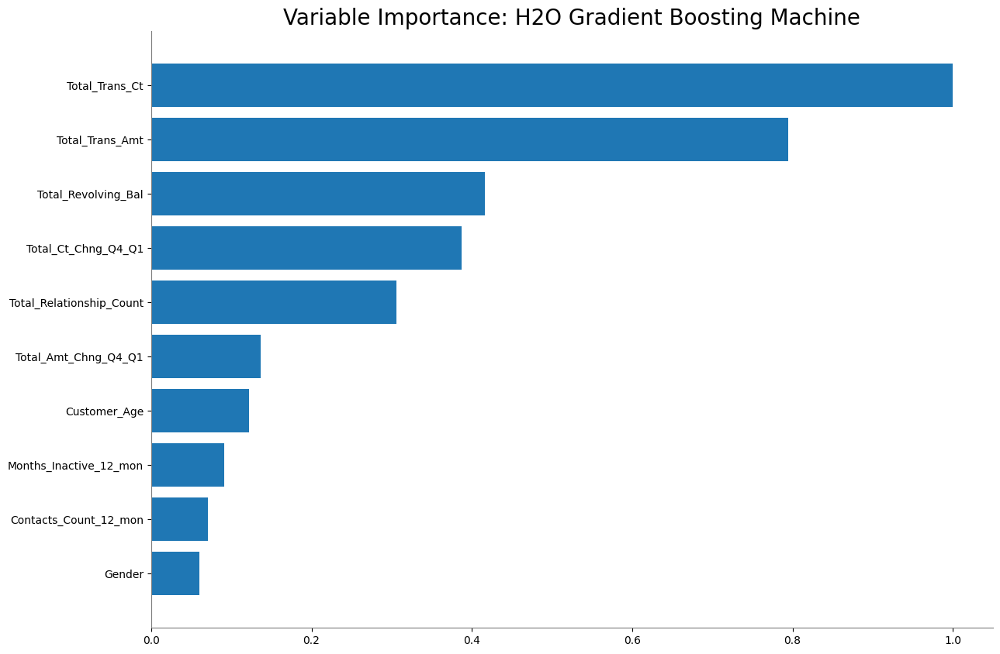

<Figure size 640x480 with 0 Axes>

In [ ]:
aml.leader.varimp_plot(num_of_features=10)

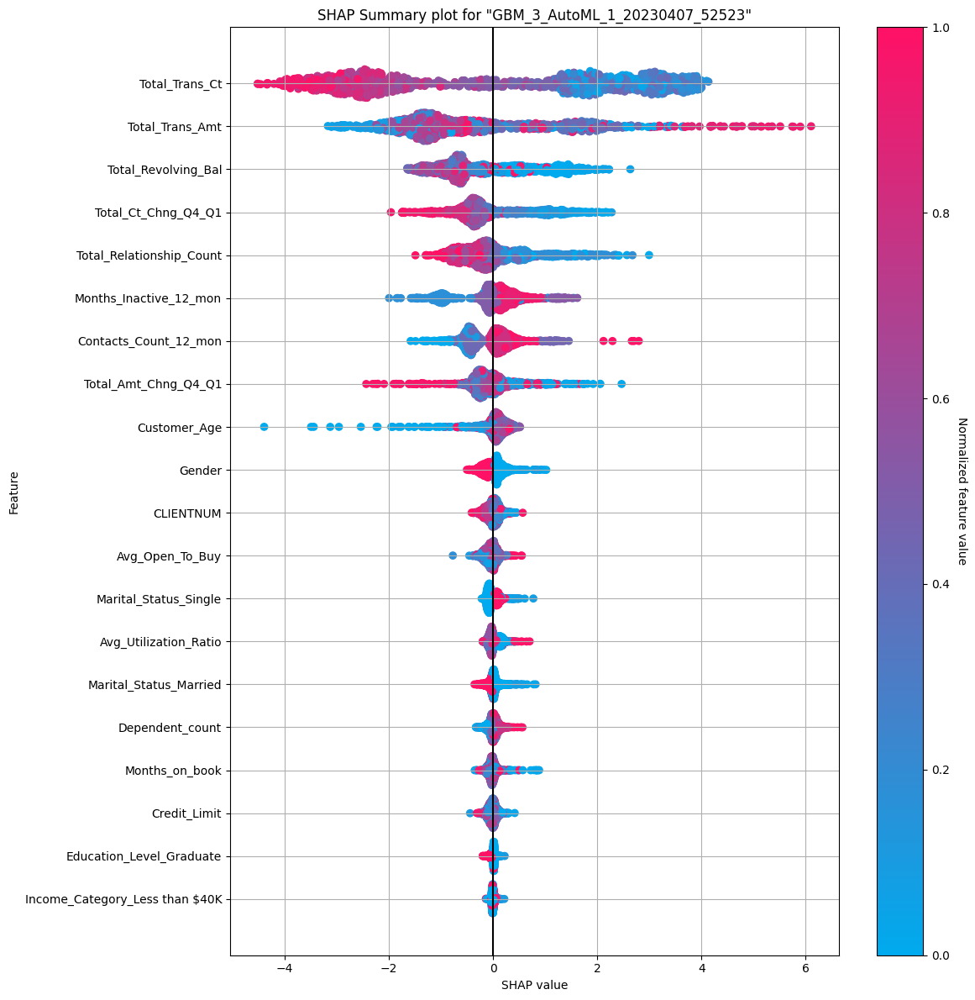

In [ ]:
aml.leader.shap_summary_plot(valid)

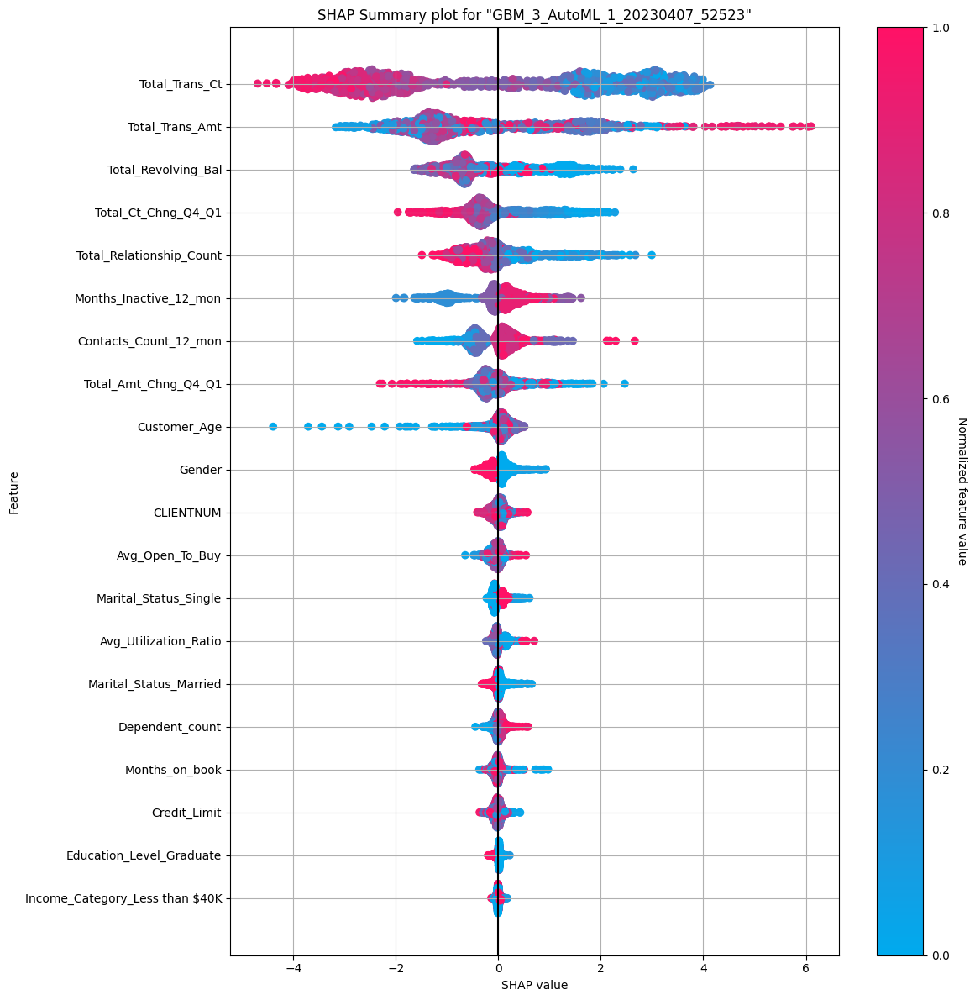

In [ ]:
aml.leader.shap_summary_plot(valid)

## autogluon 사용


In [ ]:
pip install autogluon

In [ ]:
df

,class,CLIENTNUM,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,...,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver
0,0,768805383,45,1,3,39,5,1,3,12691.0,...,0,0,1,0,0,0,1,0,0,0
1,0,818770008,49,0,5,44,6,1,2,8256.0,...,0,0,0,0,1,0,1,0,0,0
2,0,713982108,51,1,3,36,4,1,0,3418.0,...,0,0,0,1,0,0,1,0,0,0
3,0,769911858,40,0,4,34,3,4,1,3313.0,...,0,0,0,0,1,0,1,0,0,0
4,0,709106358,40,1,3,21,5,1,0,4716.0,...,0,0,1,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0,772366833,50,1,2,40,3,2,3,4003.0,...,0,1,0,0,0,0,1,0,0,0
10123,1,710638233,41,1,2,25,4,2,3,4277.0,...,0,1,0,0,0,0,1,0,0,0
10124,1,716506083,44,0,1,36,5,3,4,5409.0,...,0,0,0,0,1,0,1,0,0,0
10125,1,717406983,30,1,2,36,4,3,3,5281.0,...,0,1,0,0,0,0,1,0,0,0


In [ ]:
from autogluon.tabular import TabularDataset, TabularPredictor

In [ ]:
# split data
train, test = train_test_split(df, test_size=0.2, random_state=1234)

In [ ]:
train_data = TabularDataset(train)
test_data = TabularDataset(test)

In [ ]:
# define target column
label = 'class'

In [ ]:
# Define problem type
problem_type = 'binary_classification'

In [ ]:
predictor = TabularPredictor(label=label).fit(train_data=train_data)


In [ ]:
predictions = predictor.predict(test_data)

In [ ]:
y_pred = predictor.predict_proba(test_data)

In [ ]:
# Get predicted probabilities for each class
y_proba = predictor.predict_proba(test_data)

In [ ]:
predictor.leaderboard(train_data, silent=True)

,model,score_test,score_val,pred_time_test,pred_time_val,fit_time,pred_time_test_marginal,pred_time_val_marginal,fit_time_marginal,stack_level,can_infer,fit_order
0,WeightedEnsemble_L2,0.998025,0.981504,4.048198,0.130193,24.684832,0.010878,0.002401,1.148339,2,True,14
1,LightGBM,0.997778,0.977805,2.667814,0.078875,3.759247,2.667814,0.078875,3.759247,1,True,4
2,LightGBMLarge,0.997531,0.975339,1.287226,0.037666,4.273644,1.287226,0.037666,4.273644,1,True,13
3,LightGBMXT,0.997531,0.975339,1.788347,0.037367,2.738824,1.788347,0.037367,2.738824,1,True,3
4,XGBoost,0.996544,0.974106,0.522266,0.013597,2.438870,0.522266,0.013597,2.438870,1,True,11
5,RandomForestGini,0.996050,0.960543,1.442065,0.145334,6.044919,1.442065,0.145334,6.044919,1,True,5
6,RandomForestEntr,0.995926,0.959309,1.361552,0.116601,5.677363,1.361552,0.116601,5.677363,1,True,6
7,NeuralNetTorch,0.995433,0.958076,0.182232,0.034897,44.670254,0.182232,0.034897,44.670254,1,True,12
8,NeuralNetFastAI,0.993828,0.955610,1.321361,0.038541,15.359996,1.321361,0.038541,15.359996,1,True,10
9,ExtraTreesEntr,0.993211,0.932182,2.158899,0.170042,2.188935,2.158899,0.170042,2.188935,1,True,9


In [ ]:
predictor = TabularPredictor(label=label, eval_metric='logloss').fit(train_data)

No path specified. Models will be saved in: "AutogluonModels/ag-20230407_033238/"


ValueError: ignored